# Objetivo

O objetivo deste trabalho é construir uma pipeline de dados completa usando a plataforma Databricks Community, desde a coleta e organização dos dados até a análise final, utilizando os conceitos de data lakes e processamento com Spark. O foco está nos dados históricos das Olimpíadas, com o intuito de responder perguntas sobre os atletas, países e esportes mais relevantes ao longo dos anos.

Para isso, foram utilizados dois arquivos do dataset público disponível no Kaggle:

Olympic_Athlete_Bio.csv

Olympic_Athlete_Event_Results.csv

A modelagem dos dados será feita utilizando o padrão de camadas:

- Bronze: dados brutos, exatamente como foram coletados.
- Silver: dados limpos, estruturados e organizados em tabelas com schema.
- Gold: tabelas analíticas, com métricas e agregações que facilitam a análise.

As perguntas que orientam este trabalho são:

- Quais são os países que mais ganharam medalhas olímpicas?
- Quais foram os atletas que mais ganharam medalhas olímpicas em uma edição?
- Quais são os países que mais tiveram atletas nas Olimpíadas?
- Qual esporte teve mais atletas nesse peírodo ?
- Qual a porcentagem de homens e mulheres no esporte com maior número de atletas?

A partir disso, será possível criar gráficos e responder às perguntas com base em dados confiáveis e bem processados.

#  Coleta

Os dados utilizados neste projeto foram retirados do seguinte link no Kaggle:https://www.kaggle.com/datasets/josephcheng123456/olympic-historical-dataset-from-olympediaorg?select=Olympic_Athlete_Event_Results.csv.

Foram utilizadas duas tabelas principais:

Olympic_Athlete_Bio.csv

Olympic_Athlete_Event_Results.csv

Esses dados foram obtidos por meio de web scraping do site www.olympedia.org, que possui um dos conjuntos de dados mais completos e atualizados sobre as Olimpíadas, cobrindo desde os Jogos de Atenas em 1896 até os Jogos de Inverno de Pequim em 2022.

O processo de coleta foi feito com Python e a biblioteca BeautifulSoup, e o código do projeto está disponível no GitHub, conforme informado na página da base de dados no Kaggle.

Como os dados são públicos, não há problemas relacionados à privacidade ou confidencialidade.

## Catálago dos Dados

O catálago será anexado no GIT HUB

In [0]:
atleta_resultado_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/hcefigueiredo@gmail.com/Olympic_Athlete_Event_Results.csv")
atleta_bio_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/hcefigueiredo@gmail.com/bio-1.csv")

Verificando a base atleta_resultado_df

In [0]:
display(atleta_resultado_df)

edition,edition_id,country_noc,sport,event,result_id,athlete,athlete_id,pos,medal,isTeamSport
1908 Summer Olympics,5,ANZ,Athletics,"100 metres, Men",56265,Ernest Hutcheon,64710,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"400 metres, Men",56313,Henry Murray,64756,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Harvey Sutton,64808,3 h8 r1/2,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Guy Haskins,922519,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Joseph Lynch,64735,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Henry Murray,64756,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Joseph Lynch,64735,5 h2 r1/2,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Charles Swain,79576,AC h3 r1/2,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Guy Haskins,922519,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,George Blake,64619,DNS,null,False


Verificando a base atleta_bio_df

In [0]:
display(atleta_bio_df)

athlete_id,name,sex,birth_date,birth_year,height,weight,country,country_noc,description,special_notes
2303707,A. Sansores,Male,null,null,null,null,Cuba,CUB,null,null
2303703,Álvaro Ledón,Male,null,null,null,null,Cuba,CUB,null,null
921722,Abelardo Cuevas,Male,null,null,null,null,Cuba,CUB,"Abelardo Cuevas was a Cuban oboist, hornist, saxophonist and composer. During the 1930s, he studied and taught at the Municipal Academy of Music of Remedios, a town on the northern coast of Cuba, where he also led a saxophone septet (Septimino Cuevas). About 10 years later, Cuevas became a member of the Conjunto Sinfónico de Saxofones (Symphonic Saxophones’ Ensemble), which was founded by Francisco “Tito” D’Rivera, a classical musician, conductor and saxophone player.",null
2303702,V. Fernández,Male,null,null,null,null,Cuba,CUB,null,null
2303738,A. F. Ruiz,Male,null,null,null,null,Cuba,CUB,null,null
2303699,M. Casas,Male,null,null,null,null,Cuba,CUB,null,null
902625,Efrén Rodríguez,Male,null,null,null,null,Cuba,CUB,null,null
61627,Pedro Cisneros,Male,null,null,null,null,Cuba,CUB,null,null
921724,Rogelio Pazquez,Male,null,null,null,null,Cuba,CUB,null,null
2303701,L. Centon,Male,null,null,null,null,Cuba,CUB,null,null


# Modelagem

Para este projeto, adotamos um modelo de dados no estilo Data Lake estruturado em camadas, seguindo o padrão Delta Lakehouse, que permite gerenciar dados com eficiência, qualidade e escalabilidade. As camadas que estruturam o fluxo dos dados são:

- Bronze: onde os dados são armazenados em sua forma original, bruta, exatamente como foram coletados, mantendo o máximo de fidelidade ao conteúdo original.
- Silver: nessa etapa, os dados passam por uma limpeza, ajustes de schema, padronizações e enriquecimentos. Aqui garantimos que os dados estejam organizados, consistentes e prontos para análise.
- Gold: camada final, onde os dados já foram agregados e estão organizados de acordo com as regras de negócio, prontos para visualização, geração de relatórios e análises avançadas.

O modelo adotado foi do tipo flat por conceito, uma abordagem comum em Data Lakes, onde as informações são organizadas em tabelas relacionadas a um mesmo tema, facilitando a leitura e processamento.

Criando a camada bronze 

In [0]:
%sql
CREATE DATABASE IF NOT EXISTS bronze;


criando a tabela atleta_bio na camada bronze

In [0]:
atleta_bio_df.write.mode("overwrite").saveAsTable("bronze.atleta_bio")

criando a tabela atleta_resultado na camada bronze

In [0]:
atleta_resultado_df.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("bronze.atleta_resultado")

verificando a tabela atleta_bio na camada `bronze`

In [0]:
%sql select * from bronze.atleta_bio limit 10

athlete_id,name,sex,birth_date,birth_year,height,weight,country,country_noc,description,special_notes
2303707,A. Sansores,Male,null,null,null,null,Cuba,CUB,null,null
2303703,Álvaro Ledón,Male,null,null,null,null,Cuba,CUB,null,null
921722,Abelardo Cuevas,Male,null,null,null,null,Cuba,CUB,"Abelardo Cuevas was a Cuban oboist, hornist, saxophonist and composer. During the 1930s, he studied and taught at the Municipal Academy of Music of Remedios, a town on the northern coast of Cuba, where he also led a saxophone septet (Septimino Cuevas). About 10 years later, Cuevas became a member of the Conjunto Sinfónico de Saxofones (Symphonic Saxophones’ Ensemble), which was founded by Francisco “Tito” D’Rivera, a classical musician, conductor and saxophone player.",null
2303702,V. Fernández,Male,null,null,null,null,Cuba,CUB,null,null
2303738,A. F. Ruiz,Male,null,null,null,null,Cuba,CUB,null,null
2303699,M. Casas,Male,null,null,null,null,Cuba,CUB,null,null
902625,Efrén Rodríguez,Male,null,null,null,null,Cuba,CUB,null,null
61627,Pedro Cisneros,Male,null,null,null,null,Cuba,CUB,null,null
921724,Rogelio Pazquez,Male,null,null,null,null,Cuba,CUB,null,null
2303701,L. Centon,Male,null,null,null,null,Cuba,CUB,null,null


verificando a tabela atleta_resultado na camada bronze

In [0]:
%sql select * from bronze.atleta_resultado limit 100


edition,edition_id,country_noc,sport,event,result_id,athlete,athlete_id,pos,medal,isTeamSport
1908 Summer Olympics,5,ANZ,Athletics,"100 metres, Men",56265,Ernest Hutcheon,64710,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"400 metres, Men",56313,Henry Murray,64756,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Harvey Sutton,64808,3 h8 r1/2,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Guy Haskins,922519,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Joseph Lynch,64735,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Henry Murray,64756,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Joseph Lynch,64735,5 h2 r1/2,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Charles Swain,79576,AC h3 r1/2,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Guy Haskins,922519,DNS,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,George Blake,64619,DNS,null,False


Apos a criacao das tabelas na camada bronze vamos criar a camada silver onde os dados serão tratados 

In [0]:
%sql CREATE DATABASE silver 

Verificando se a coluna athlete_id da tabela bronze.atleta.bio tem valores duplicados

In [0]:
%sql
SELECT COUNT(DISTINCT athlete_id) AS total_ids_unicos,
       COUNT(*) AS total_linhas,
       COUNT(*) - COUNT(DISTINCT athlete_id) AS total_duplicados
FROM bronze.atleta_bio;

total_ids_unicos,total_linhas,total_duplicados
155861,155861,0


Como não há valores duplicados, não é necessário alteracões

Verificando valores nulos na tabela bronze.atleta_bio

In [0]:
%sql
SELECT 
    COUNT(*) AS total_linhas,
    COUNT(CASE WHEN athlete_id IS NULL THEN 1 END) AS athlete_id_nulos,
    COUNT(CASE WHEN name IS NULL THEN 1 END) AS name_nulos,
    COUNT(CASE WHEN sex IS NULL THEN 1 END) AS sex_nulos,
    COUNT(CASE WHEN birth_date IS NULL THEN 1 END) AS birth_date_nulos,
    COUNT(CASE WHEN birth_year IS NULL THEN 1 END) AS birth_year_nulos,
    COUNT(CASE WHEN height IS NULL THEN 1 END) AS height_nulos,
    COUNT(CASE WHEN weight IS NULL THEN 1 END) AS weight_nulos,
    COUNT(CASE WHEN country IS NULL THEN 1 END) AS country_nulos,
    COUNT(CASE WHEN country_noc IS NULL THEN 1 END) AS country_noc_nulos,
    COUNT(CASE WHEN description IS NULL THEN 1 END) AS description_nulos,
    COUNT(CASE WHEN special_notes IS NULL THEN 1 END) AS special_notes_nulos
FROM bronze.atleta_bio;


total_linhas,athlete_id_nulos,name_nulos,sex_nulos,birth_date_nulos,birth_year_nulos,height_nulos,weight_nulos,country_nulos,country_noc_nulos,description_nulos,special_notes_nulos
155861,0,0,0,6650,4167,50749,51710,0,0,100998,95224


Nessa tabela não há valores nulos que necessitem tratamento 

Verificando valores nulos agora na outra tabela

In [0]:
%sql
SELECT 
  COUNT(*) AS total_linhas,
  COUNT(CASE WHEN edition IS NULL THEN 1 END) AS edition_nulos,
  COUNT(CASE WHEN edition_id IS NULL THEN 1 END) AS edition_id_nulos,
  COUNT(CASE WHEN country_noc IS NULL THEN 1 END) AS country_noc_nulos,
  COUNT(CASE WHEN sport IS NULL THEN 1 END) AS sport_nulos,
  COUNT(CASE WHEN event IS NULL THEN 1 END) AS event_nulos,
  COUNT(CASE WHEN result_id IS NULL THEN 1 END) AS result_id_nulos,
  COUNT(CASE WHEN athlete IS NULL THEN 1 END) AS athlete_nulos,
  COUNT(CASE WHEN athlete_id IS NULL THEN 1 END) AS athlete_id_nulos,
  COUNT(CASE WHEN pos IS NULL THEN 1 END) AS pos_nulos,
  COUNT(CASE WHEN medal IS NULL THEN 1 END) AS medal_nulos,
  COUNT(CASE WHEN isTeamSport IS NULL THEN 1 END) AS is_team_sport_nulos
FROM bronze.atleta_resultado;

total_linhas,edition_nulos,edition_id_nulos,country_noc_nulos,sport_nulos,event_nulos,result_id_nulos,athlete_nulos,athlete_id_nulos,pos_nulos,medal_nulos,is_team_sport_nulos
316834,0,0,0,0,0,0,0,0,0,272147,0


Só há valores nulos na coluna meladalhas, o que faz sentido já que apenas os 3 melhores colocados de cada prova recebem.

ao verificar a base ao importa-la, notei a presenca na coluna "pos" algumas céluas preenchidas erradas, então vamos verificar essa coluna

In [0]:
%sql
SELECT 
  pos,
  COUNT(*) AS total
FROM bronze.atleta_resultado
GROUP BY pos
ORDER BY total DESC;



pos,total
1,16278
2,15746
3,14350
4,13444
5,11847
6,11332
7,10313
8,9858
DNS,8516
DNF,8104


É possível notar que exstem muitas células preenchidass erradas, então vamos excluir essa coluna para não comprometer nossa tabela na camda gold.

Criando a tabela bronze.atleta_resultado na camada silver reitando as colunas "is_team_sport", "pos"e "position", após a limpeza dos dados.

In [0]:
df_silver = spark.table("silver.atleta_resultado")
df_silver_ajustado = df_silver.drop("is_team_sport", "pos", "position")
df_silver_ajustado.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("silver.atleta_resultado")

Criando a tabela bronze.atleta_bio na camada silver,onde não foi nessesária nenhuma limpeza

In [0]:
df_bronze = spark.read.table("bronze.atleta_bio")
df_bronze.write.mode("overwrite").saveAsTable("silver.atleta_bio")

verificando a tabela silver.atleta_bio

In [0]:
%sql select * from silver.atleta_bio

athlete_id,name,sex,birth_date,birth_year,height,weight,country,country_noc,description,special_notes
2303707,A. Sansores,Male,null,null,null,null,Cuba,CUB,null,null
2303703,Álvaro Ledón,Male,null,null,null,null,Cuba,CUB,null,null
921722,Abelardo Cuevas,Male,null,null,null,null,Cuba,CUB,"Abelardo Cuevas was a Cuban oboist, hornist, saxophonist and composer. During the 1930s, he studied and taught at the Municipal Academy of Music of Remedios, a town on the northern coast of Cuba, where he also led a saxophone septet (Septimino Cuevas). About 10 years later, Cuevas became a member of the Conjunto Sinfónico de Saxofones (Symphonic Saxophones’ Ensemble), which was founded by Francisco “Tito” D’Rivera, a classical musician, conductor and saxophone player.",null
2303702,V. Fernández,Male,null,null,null,null,Cuba,CUB,null,null
2303738,A. F. Ruiz,Male,null,null,null,null,Cuba,CUB,null,null
2303699,M. Casas,Male,null,null,null,null,Cuba,CUB,null,null
902625,Efrén Rodríguez,Male,null,null,null,null,Cuba,CUB,null,null
61627,Pedro Cisneros,Male,null,null,null,null,Cuba,CUB,null,null
921724,Rogelio Pazquez,Male,null,null,null,null,Cuba,CUB,null,null
2303701,L. Centon,Male,null,null,null,null,Cuba,CUB,null,null


Verificando a Tabela silver.atleta_resultado

In [0]:
%sql select * from silver.atleta_resultado


edition,edition_id,country_noc,sport,event,result_id,athlete,athlete_id,medal,isTeamSport
1908 Summer Olympics,5,ANZ,Athletics,"100 metres, Men",56265,Ernest Hutcheon,64710,null,False
1908 Summer Olympics,5,ANZ,Athletics,"400 metres, Men",56313,Henry Murray,64756,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Harvey Sutton,64808,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Guy Haskins,922519,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Joseph Lynch,64735,null,False
1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Henry Murray,64756,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Joseph Lynch,64735,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Charles Swain,79576,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,Guy Haskins,922519,null,False
1908 Summer Olympics,5,ANZ,Athletics,"1,500 metres, Men",56349,George Blake,64619,null,False


Após a limpeza dos dados, vamos criar a tabela gold onde ficarão as tabelas agregadas com métrias de interesse de acordo com a regra de negócio.

In [0]:
%sql create database gold

criando a tabela gold.top10_pais_medalhas

In [0]:
query_top10_pais_medalhas = """
CREATE OR REPLACE TABLE gold.top10_pais_medalhas AS
SELECT 
    T.country AS pais, 
    COUNT(N.medal) AS total_medalhas
FROM silver.atleta_bio AS T
JOIN silver.atleta_resultado AS N 
    ON N.athlete_id = T.athlete_id
WHERE N.medal IS NOT NULL AND N.medal <> 'None'
GROUP BY T.country
ORDER BY total_medalhas DESC
LIMIT 10
"""
spark.sql(query_top10_pais_medalhas)

Out[48]: DataFrame[num_affected_rows: bigint, num_inserted_rows: bigint]

Criando a tabela gold.top10_atletas_uma_edicao

In [0]:
query_top10_atletas_uma_edicao = """
CREATE OR REPLACE TABLE gold.top10_atletas_uma_edicao AS
SELECT 
    N.athlete AS atleta, 
    N.edition AS edicao, 
    COUNT(N.medal) AS total_medalhas
FROM silver.atleta_resultado AS N
WHERE N.medal IS NOT NULL AND N.medal <> 'None'
GROUP BY N.athlete, N.edition
ORDER BY total_medalhas DESC
LIMIT 10
"""
spark.sql(query_top10_atletas_uma_edicao)

Out[49]: DataFrame[num_affected_rows: bigint, num_inserted_rows: bigint]

Criando a tabela gold.top10_pais_total_atletas 

In [0]:
query_top10_pais_total_atletas = """
CREATE OR REPLACE TABLE gold.top10_pais_total_atletas AS
SELECT 
    T.country AS pais, 
    COUNT(DISTINCT N.athlete_id) AS total_atletas
FROM silver.atleta_bio AS T
JOIN silver.atleta_resultado AS N 
    ON N.athlete_id = T.athlete_id
GROUP BY T.country
ORDER BY total_atletas DESC
LIMIT 10
"""
spark.sql(query_top10_pais_total_atletas)

Out[50]: DataFrame[num_affected_rows: bigint, num_inserted_rows: bigint]

Criando a tabela gold.esporte_mais_popular

In [0]:
query_esporte_mais_popular = """
CREATE OR REPLACE TABLE gold.esporte_mais_popular AS
SELECT 
    R.sport, 
    COUNT(DISTINCT B.athlete_id) AS total_atletas
FROM silver.atleta_bio AS B
JOIN silver.atleta_resultado AS R 
    ON B.athlete_id = R.athlete_id
GROUP BY R.sport
ORDER BY total_atletas DESC
LIMIT 1
"""
spark.sql(query_esporte_mais_popular)

Out[51]: DataFrame[num_affected_rows: bigint, num_inserted_rows: bigint]

Verificando esporte mais popular

In [0]:
query_sexo_esporte_mais_popular = """
WITH EsporteMaisPopular AS (
    SELECT 
        R.sport, 
        COUNT(DISTINCT B.athlete_id) AS total_atletas
    FROM silver.atleta_bio AS B
    JOIN silver.atleta_resultado AS R 
        ON B.athlete_id = R.athlete_id
    GROUP BY R.sport
    ORDER BY total_atletas DESC
    LIMIT 1
)
SELECT 
    B.sex, 
    COUNT(DISTINCT B.athlete_id) AS total
FROM silver.atleta_bio AS B
JOIN silver.atleta_resultado AS R 
    ON B.athlete_id = R.athlete_id
JOIN EsporteMaisPopular AS E
    ON R.sport = E.sport
GROUP BY B.sex
"""
spark.sql(query_sexo_esporte_mais_popular)

Out[52]: DataFrame[sex: string, total: bigint]

Criando tabela gold.distribuicao_sexo_esporte_popular

In [0]:
query_distribuicao_sexo_esporte_popular = """
CREATE OR REPLACE TABLE gold.distribuicao_sexo_esporte_popular AS
SELECT 
    sex, 
    total
FROM (
    SELECT 
        B.sex, 
        COUNT(DISTINCT B.athlete_id) AS total
    FROM silver.atleta_bio AS B
    JOIN silver.atleta_resultado AS R 
        ON B.athlete_id = R.athlete_id
    JOIN gold.esporte_mais_popular AS E
        ON R.sport = E.sport
    GROUP BY B.sex
)
"""
spark.sql(query_distribuicao_sexo_esporte_popular)

Out[53]: DataFrame[num_affected_rows: bigint, num_inserted_rows: bigint]

# **ANÁLISE**

## Qualidade dos Dados

Foi realizada uma análise da qualidade para cada atributo dos conjuntos de dados silver.atleta_bio e silver.atleta_resultado, avaliando principalmente:
- Presença de valores nulos ou vazios
- Existência de valores duplicados
- Valores inválidos ou fora de padrão

Após a análise:
- Não foram encontrados problemas graves que comprometessem as análises.
- Campos desnecessários ou duplicados (ex: position e is_team_sport) foram removidos na camada Silver para garantir consistência e limpeza do schema.
- A junção entre as tabelas foi validada com base em athlete_id.

## Perguntas

Importando bibliotecas para os gráficos

In [0]:
import matplotlib.pyplot as plt
import pandas as pd

###   1.	Qual o país que mais ganhou medalhas olímpicas?

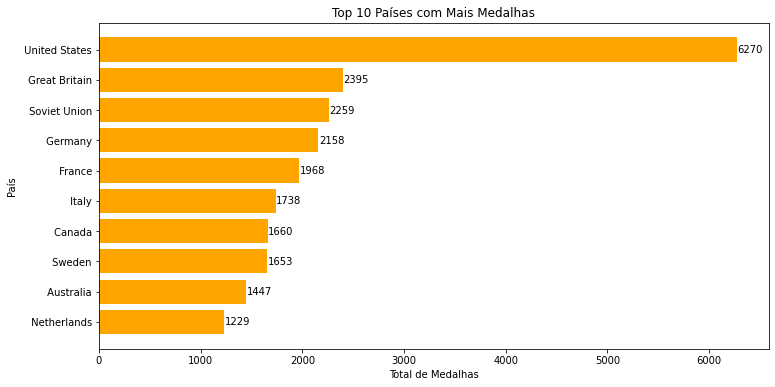

In [0]:
query_top10_pais_medalhas = """
SELECT pais, total_medalhas
FROM gold.top10_pais_medalhas
"""
df_top10_pais_medalhas = spark.sql(query_top10_pais_medalhas).toPandas()

# Gráfico
plt.figure(figsize=(12, 6))
bars = plt.barh(df_top10_pais_medalhas["pais"], df_top10_pais_medalhas["total_medalhas"], color='orange')
for bar, valor in zip(bars, df_top10_pais_medalhas["total_medalhas"]):
   plt.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, str(valor), va='center')
plt.xlabel("Total de Medalhas")
plt.ylabel("País")
plt.title("Top 10 Países com Mais Medalhas")
plt.gca().invert_yaxis()  
plt.show()

O País com a maior quantidade de medalhas nesse período é os Estados Unidos com 6270 no total.

### 2.	Quais foram os atletas que mais ganharam medalhas olímpicas em uma edição? 

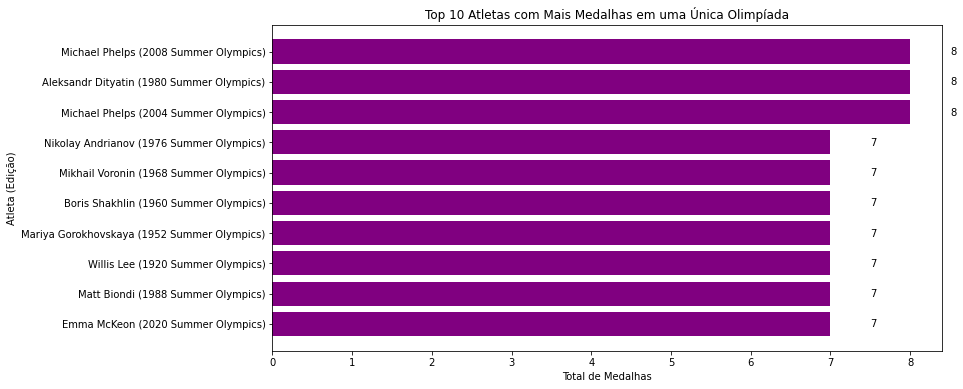

In [0]:
query_top10_atletas_uma_edicao = """
SELECT atleta, edicao, total_medalhas
FROM gold.top10_atletas_uma_edicao
"""
df_top10_atletas_uma_edicao = spark.sql(query_top10_atletas_uma_edicao).toPandas()
df_top10_atletas_uma_edicao["rotulo"] = df_top10_atletas_uma_edicao["atleta"] + " (" + df_top10_atletas_uma_edicao["edicao"].astype(str) + ")"

# Gráfico
plt.figure(figsize=(12, 6))
bars = plt.barh(df_top10_atletas_uma_edicao["rotulo"], df_top10_atletas_uma_edicao["total_medalhas"], color='purple')
for bar, valor in zip(bars, df_top10_atletas_uma_edicao["total_medalhas"]):
    plt.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2, str(valor), va='center')
plt.xlabel("Total de Medalhas")
plt.ylabel("Atleta (Edição)")
plt.title("Top 10 Atletas com Mais Medalhas em uma Única Olimpíada")
plt.gca().invert_yaxis() 
plt.show()

Dois Atletas estão empatados como atletas que mais ganharam medalhas olimpicas em uma ediçao, são eles Michael Phelps e Aleksandr Dityatin. Entretanto Phelps conseguiu esse feito duas vez.

### 3.	Quais são os países que mais tiveram atletas nas olimpíadas?

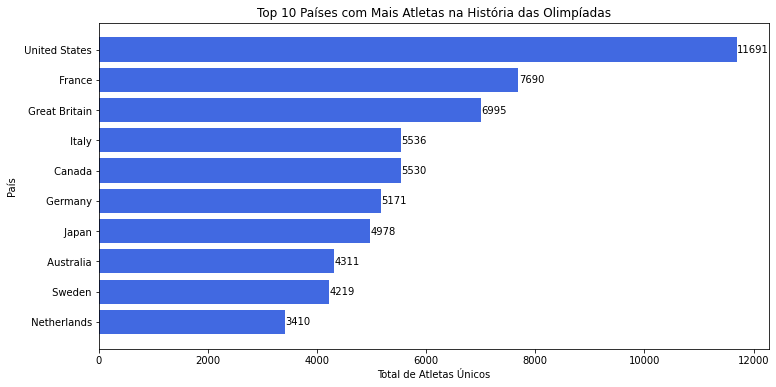

In [0]:
query_top10_pais_total_atletas = """
SELECT pais, total_atletas
FROM gold.top10_pais_total_atletas
"""
df_top10_pais_total_atletas = spark.sql(query_top10_pais_total_atletas).toPandas()

# Gráfico
plt.figure(figsize=(12, 6))
bars = plt.barh(df_top10_pais_total_atletas["pais"], df_top10_pais_total_atletas["total_atletas"], color='royalblue')
for bar, valor in zip(bars, df_top10_pais_total_atletas["total_atletas"]):
    plt.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, str(valor), va='center')
plt.xlabel("Total de Atletas Únicos")
plt.ylabel("País")
plt.title("Top 10 Países com Mais Atletas na História das Olimpíadas")
plt.gca().invert_yaxis()  # Inverte a ordem das barras
plt.show()

Os países que mais tiveram atletas nas olimpiadas durante esse período são Estados Unido, liderando com 11691 atletas, seguidos de Franca, Reino Unido, Itália, Canada, Germany, Jpão, Austrália, Suecia e Holanda.

### 4.	Qual esporte teve mais atletas na história?

In [0]:
%sql
SELECT * FROM gold.esporte_mais_popular;


sport,total_atletas
Athletics,25207


Atraves dessa tabela podemos ver que o esporte mais popular é o atletismo, que reune diversas modalidades.

### 5.	Qual a porcentagem de homens e mulheres no esporte com maior numero de atletas na história?


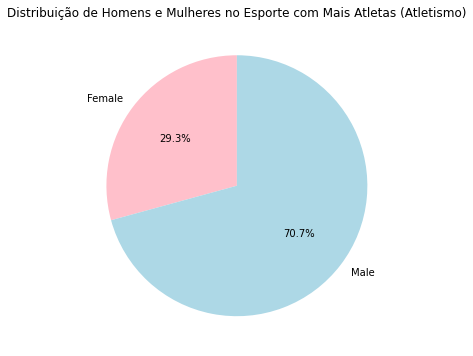

In [0]:
query_distribuicao_sexo_esporte_popular = """
SELECT sex, total
FROM gold.distribuicao_sexo_esporte_popular
"""
df_distribuicao_sexo = spark.sql(query_distribuicao_sexo_esporte_popular).toPandas()

# Gráfico de pizza
labels = df_distribuicao_sexo['sex']
valores = df_distribuicao_sexo['total']
plt.figure(figsize=(6, 6))
plt.pie(valores, labels=labels, autopct='%1.1f%%', colors=['pink', 'lightblue'], startangle=90)
plt.title("Distribuição de Homens e Mulheres no Esporte com Mais Atletas (Atletismo)")
plt.show()


O Esporte mais praticado é o atletismo, e ao longo desse 70,7% dos atletas são homens enquanto 29,3% são mulheres

# Autoavaliação

O Sprint de Engenharia de Dados é meu ultimo sprint do curso e acredito que tenha sido de longe o mais desafiador. Tive dificuldades no inicío da elaboracao do trabalho para entender como fazer e com o funcionamento da plataforma Databricks, porem ao assistiar as aulas de platão de dúvidas do MVP e estudar um pocou sobre a plataforma, acredito que tenha conseguido alcancar todos o tópicos do trabalho e meus objetivos delieneados no início do projeto. Acredito que para o futuro possa melhorar a limpeza da camada silver e evoluir as minhas análise para algo mais complexo.